[__<< Data Cleaning__](./02_Divvy_data_cleaning.ipynb) | [__Home__](../README.md) | [__Feature Engineering >>__](./04_Divvy_feature_engineering.ipynb)


# Divvy: Bike Sharing Forecast
## Exploratory Data Analysis

__Dataset:__ [Divvy Data](https://divvybikes.com/system-data) \
__Author:__ [Dmitry Luchkin](https://www.linkedin.com/in/dmitry-luchkin/) \
__Date:__ March 2025

### Goals/Objectives <a name="objectives"></a>

- Generate descriptive statistics for each column.
- Plot histograms or density plots for numerical variables.
- Create bar plots for categorical variables to understand their distribution.
- Create correlation matrices to identify relationships between numerical variables.
- Plot time series data to observe trends and seasonal patterns.
- Map data points to visualize geographical distribution.
- Verify that data values are consistent across different columns.
- Ensure numerical values fall within expected ranges.
- Check for logical inconsistencies


### Notebooks <a class="anchor" name='notebooks'></a>

+ [Initial Data Exploration](./01_Divvy_data_exploration.ipynb)
+ [Data Cleaning](./02_Divvy_data_cleaning.ipynb)
+ __[Exploratory Data Analysis](./03_Divvy_exploratory_data_analysis.ipynb)__
+ [Feature Engineering](./04_Divvy_feature_engineering.ipynb)
+ [Modeling & Validation](./05_Divvy_forecasting.ipynb)

### Import Libraries <a name='import-libraries'></a>

In [1]:
import datetime
import sys
import re
import pickle

import pandas as pd
import numpy as np
import statsmodels as sm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

sys.path.append('../02_scripts/')

%matplotlib inline

### Notebook Setup <a name='notebook-setup'></a>

In [2]:
# Pandas settings
pd.options.display.max_rows = 20
pd.options.display.max_columns = None
pd.options.display.max_colwidth = 60
pd.options.display.float_format = '{:,.4f}'.format

# Visualization settings
from matplotlib import rcParams
plt.style.use('fivethirtyeight')
rcParams['figure.figsize'] = (16, 5)   
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
rcParams['font.size'] = 12
rcParams['savefig.dpi'] = 300
plt.rc('xtick', labelsize=11)
plt.rc('ytick', labelsize=11)
%config InlineBackend.figure_format = 'retina'

In [3]:
from IPython.display import Markdown
from IPython.core.magic import register_cell_magic


@register_cell_magic
def markdown(line, cell):
    return Markdown(cell.format(**globals()))

### ToDo's <a name='todos'></a>

In [4]:
# get all tasks from the previous phase

sys.path.append('../02_scripts/')
from todo_list import extract_todo_patterns

print(f'{'-'*5} TASKS FROM PREVIOUS PHASE {'-'*5}')
for todo in extract_todo_patterns('./02_Divvy_data_cleaning.ipynb'):
    print(f'TODO: {todo}')


----- TASKS FROM PREVIOUS PHASE -----
TODO: Use median instead of mean for `distance_km`, `duration_min` and `avg_speed_kmph`, such as median is more robust to outliers


### Loading Data <a name='loading-data'></a>

In [5]:
# loading data
%store -r data_divvy

In [6]:
data = data_divvy

In [7]:
%store -d data_divvy

In [8]:
# check data
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25478652 entries, 0 to 26384907
Data columns (total 25 columns):
 #   Column              Dtype         
---  ------              -----         
 0   ride_id             object        
 1   started_at          datetime64[ns]
 2   ended_at            datetime64[ns]
 3   start_station_name  object        
 4   start_station_id    object        
 5   end_station_name    object        
 6   end_station_id      object        
 7   start_lat           float64       
 8   start_lng           float64       
 9   end_lat             float64       
 10  end_lng             float64       
 11  rider_type          category      
 12  bike_type           category      
 13  year                int32         
 14  quarter             category      
 15  month               category      
 16  day                 int32         
 17  hour                int32         
 18  minute              int32         
 19  season              category      
 20  weekd

### EDA <a name='eda'></a>

#### Summary Statistics <a name='summary-statistics'></a>

In [9]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
started_at,25478652,2022-09-23 11:44:01.441286656,2020-01-01 00:04:44,2021-08-07 22:38:44.500000,2022-09-05 14:27:17,2023-10-20 18:13:39,2024-12-31 23:54:37.045000,NaN
ended_at,25478652,2022-09-23 12:02:49.314307072,2020-01-01 00:13:15,2021-08-07 23:03:45.500000,2022-09-05 14:51:04.500000,2023-10-20 18:27:36.249999872,2024-12-31 23:59:55.705000,NaN
start_lat,"25,478,652.0000",41.9026,41.6300,41.8812,41.8990,41.9300,42.0800,0.0446
start_lng,"25,478,652.0000",-87.6464,-87.9400,-87.6600,-87.6431,-87.6293,-87.4600,0.0274
end_lat,"25,478,652.0000",41.9029,41.4800,41.8813,41.8996,41.9300,42.3700,0.0448
end_lng,"25,478,652.0000",-87.6466,-88.1600,-87.6600,-87.6431,-87.6295,-87.3000,0.0276
year,"25,478,652.0000","2,022.1737","2,020.0000","2,021.0000","2,022.0000","2,023.0000","2,024.0000",1.3518
day,"25,478,652.0000",15.5932,1.0000,8.0000,16.0000,23.0000,31.0000,8.7733
hour,"25,478,652.0000",14.1571,0.0000,11.0000,15.0000,18.0000,23.0000,4.9247
minute,"25,478,652.0000",29.5187,0.0000,14.0000,30.0000,45.0000,59.0000,17.3004


In [10]:
categorical_cols = data.select_dtypes(include=['object', 'category']).columns
numeric_cols = data.select_dtypes(include=np.number).columns

#### Numerical columns

In [11]:
numeric_cols

Index(['start_lat', 'start_lng', 'end_lat', 'end_lng', 'year', 'day', 'hour',
       'minute', 'duration_min', 'distance_km', 'avg_speed_kmph'],
      dtype='object')

In [12]:
def distplot(df, columns, by=None, plots='all'):
    """
        Builds distribution plot (histogram, box plot, violine plot)

        Args:
            df (pandas.DataFrame): The dataset
            columns ([str]): The list of column names for which the dist plots will be built
            by ([str]): The column names to group the plots by
            plots (str: "h|b|v|all"): Determines which plots will be built: 
                                      h - histogram, b - boxplot, v - violine, all - all plots.
                                      The combinations are possible.

        Usage:
            # Build all distribution plots (histogram, boxplot, violine plot)
            distplot(df, ['distance_km', 'duration_min'])

            # Build histogram plot only by rider_type
            distplot(df, ['distance_km', 'duration_min'], by='rider_type', plots='h')

            # Build histogram and box plots by bike_type
            distplot(df, ['distance_km', 'duration_min'], by='bike_type', plots='hb')
    """
    
    for var_name in columns:
        print(f'\n[`{var_name}`]')
        if by is not None:
            print(f'Skewness:\n{np.round(df.groupby(by, observed=True)[var_name].skew(), 2)}')
        else:
            print(f'Skewness: {round(df[var_name].skew(), 2)}')
        print("""
        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        """)
        
        if by is not None:
            print(f'Kurtosis:\n{np.round(df.groupby(by, observed=True)[var_name].apply(pd.Series.kurt), 2)}')
        else:
            print(f'Kurtosis: {round(df[var_name].kurt(), 2)}')
        print("""
        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        """)
        
        plots_list = list('hbv' if plots == 'all' else plots)
        plots_count = len(plots_list)
        plt.figure(figsize = (6*plots_count, 6))
        bins = int(np.ceil(np.sqrt(df.shape[0])))
        for index, plot in zip(range(1, len(plots)+1), plots_list):
            if plot == 'h':
                plt.subplot(1, plots_count, index)
                sns.histplot(data=df, x=var_name, kde=True, bins=bins, hue=by)
                plt.ylabel('Frequence')
                plt.xlabel(var_name)
                plt.title(f'Distribution of {var_name}')
            if  plot == 'b':
                plt.subplot(1, plots_count, index)
                sns.boxplot(data=df, y=var_name, hue=by)
                plt.title(f'Box plot of {var_name}')
            if  plot == 'v':
                plt.subplot(1, plots_count, index)
                sns.violinplot(data=df, y=var_name, hue=by)
                plt.title(f'Violin plot of {var_name}')
            
        plt.show()


[`start_lat`]
Skewness:
rider_type
casual   -0.4500
member   -0.2700
Name: start_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.9200
member   1.7200
Name: start_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


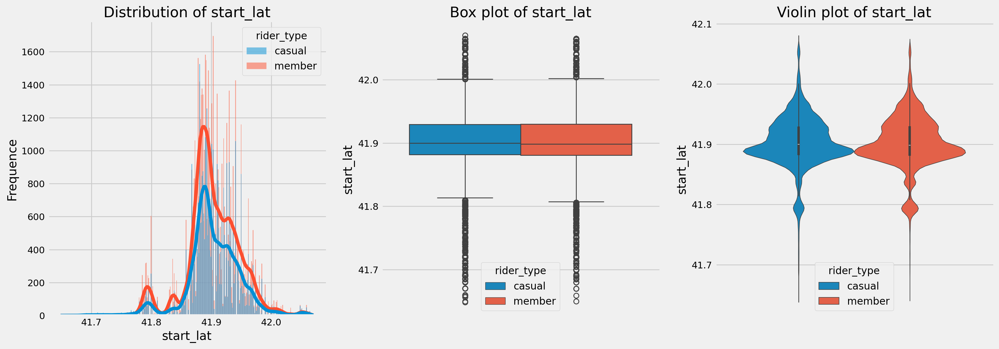


[`start_lng`]
Skewness:
rider_type
casual   -1.0700
member   -0.7400
Name: start_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.9500
member   2.4900
Name: start_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


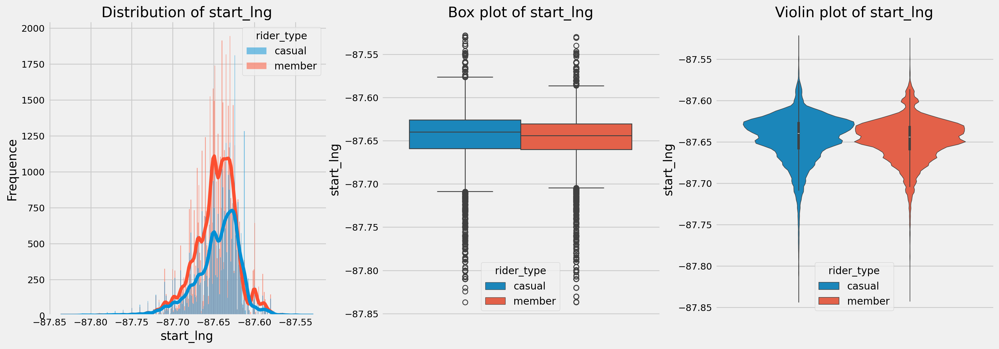


[`end_lat`]
Skewness:
rider_type
casual   -0.4700
member   -0.2600
Name: end_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.9400
member   1.6900
Name: end_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


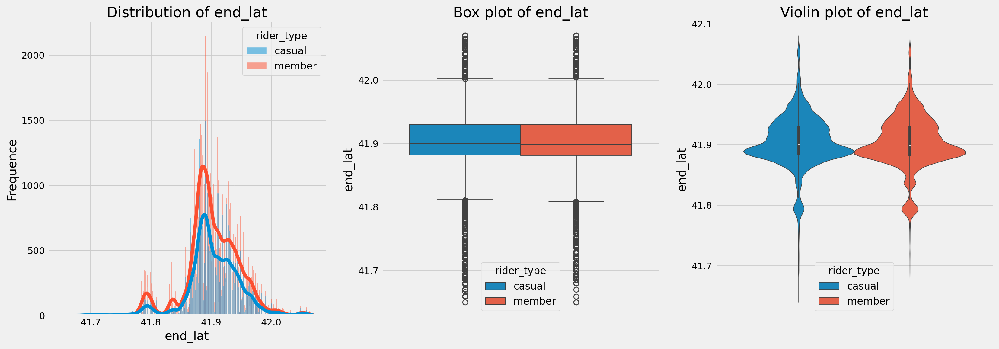


[`end_lng`]
Skewness:
rider_type
casual   -1.0700
member   -0.7600
Name: end_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   3.0200
member   2.5400
Name: end_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


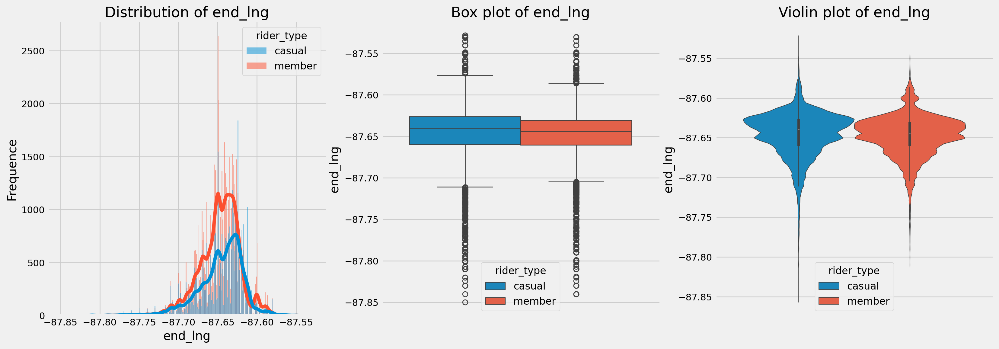


[`year`]
Skewness:
rider_type
casual    0.0100
member   -0.1900
Name: year, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -1.1900
member   -1.1900
Name: year, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


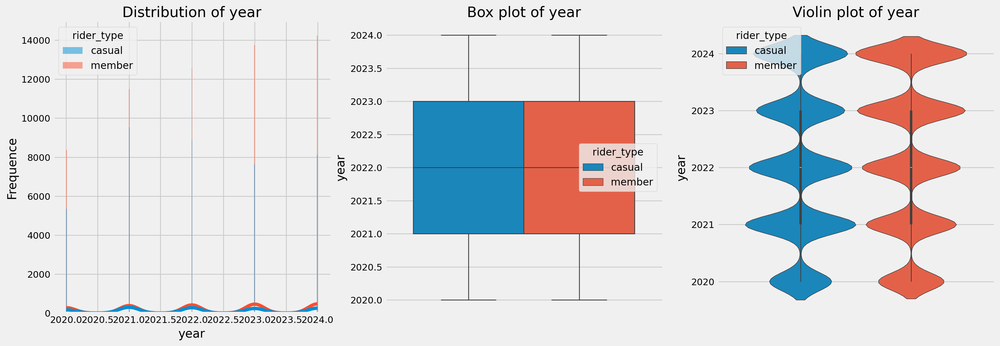


[`day`]
Skewness:
rider_type
casual   0.0300
member   0.0500
Name: day, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -1.1900
member   -1.1800
Name: day, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


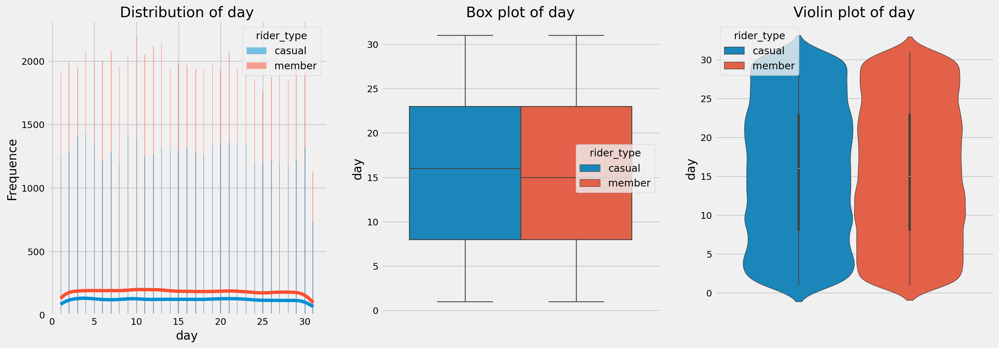


[`hour`]
Skewness:
rider_type
casual   -0.7500
member   -0.4300
Name: hour, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual    0.5300
member   -0.3900
Name: hour, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


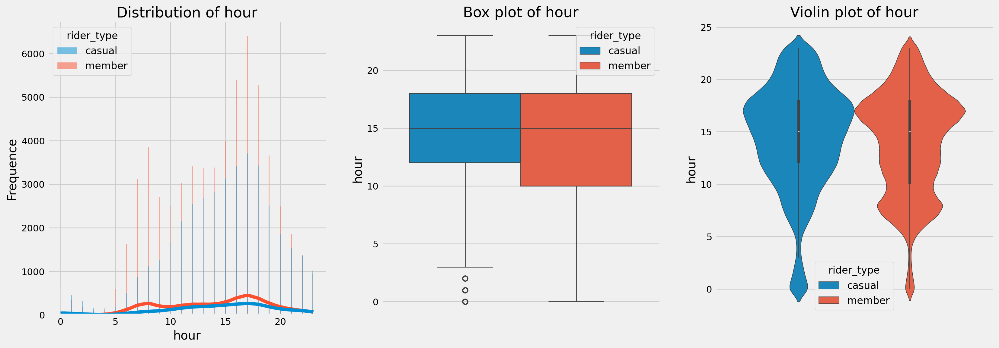


[`minute`]
Skewness:
rider_type
casual   -0.0100
member    0.0000
Name: minute, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -1.2000
member   -1.2000
Name: minute, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


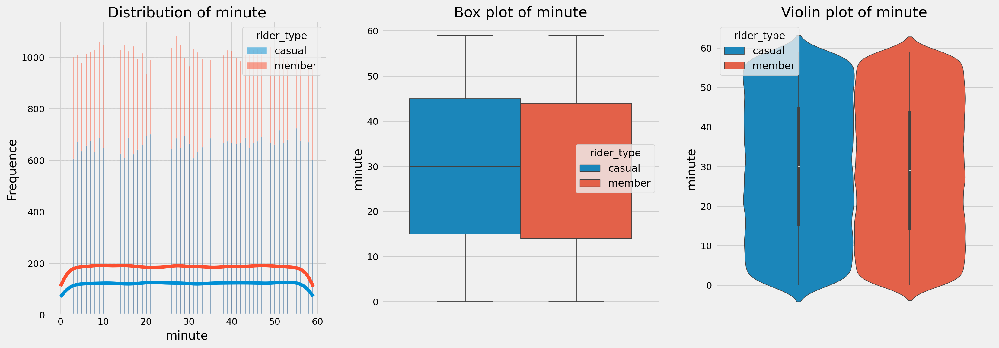


[`duration_min`]
Skewness:
rider_type
casual   140.1300
member    28.1900
Name: duration_min, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   23,566.8300
member    1,498.0800
Name: duration_min, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


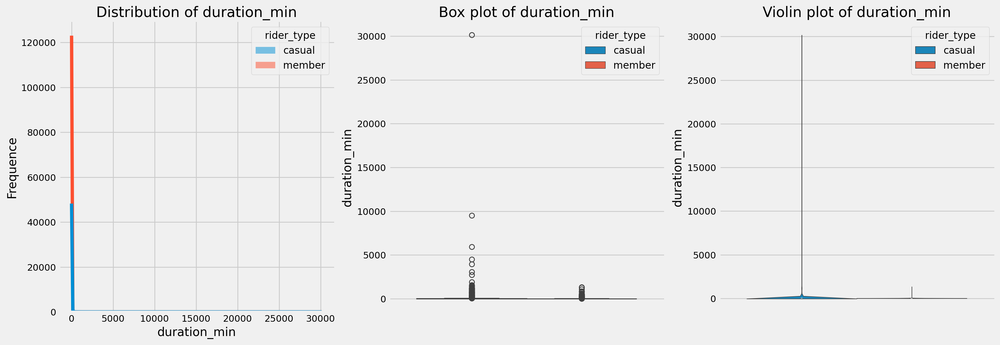


[`distance_km`]
Skewness:
rider_type
casual   2.1900
member   2.0300
Name: distance_km, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   8.3800
member   6.2700
Name: distance_km, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


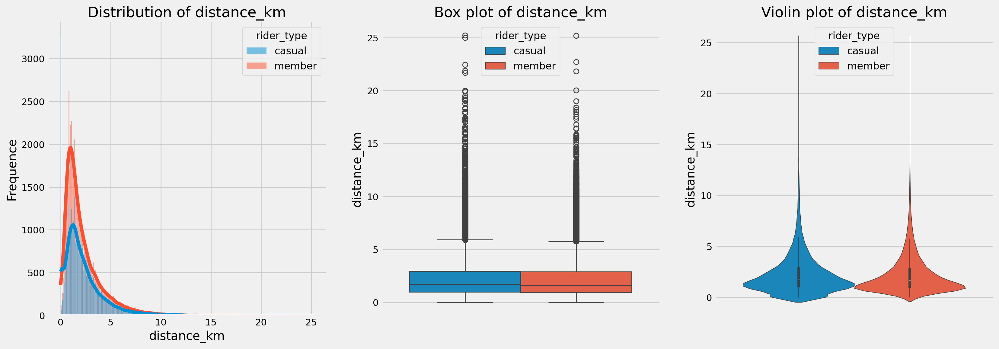


[`avg_speed_kmph`]
Skewness:
rider_type
casual   0.1800
member   0.0400
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -0.3500
member    0.6500
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


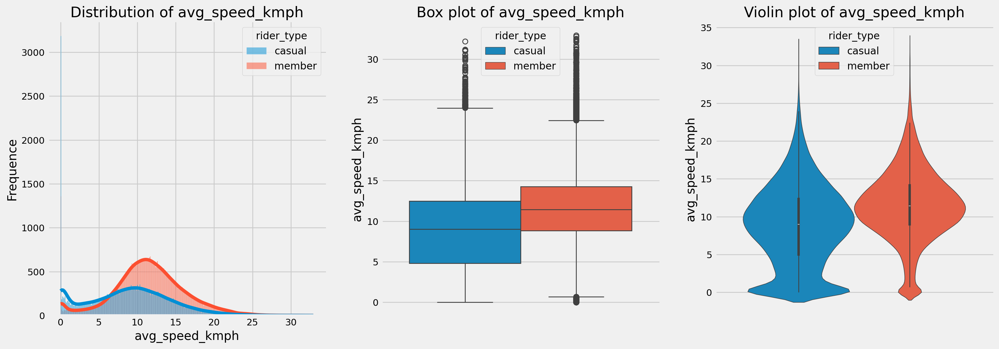

In [13]:
distplot(data.sample(n=1_00_000, random_state=12345), numeric_cols, by='rider_type')


[`start_lat`]
Skewness:
bike_type
electric_bike   -0.5300
regular_bike    -0.1600
Name: start_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.3700
regular_bike    1.9300
Name: start_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


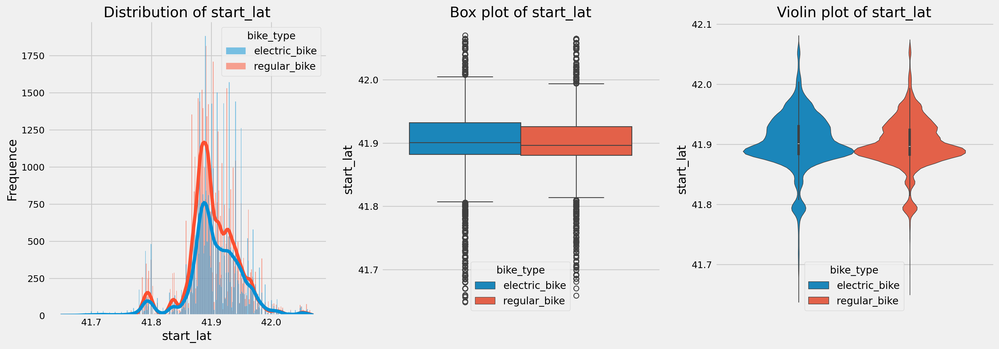


[`start_lng`]
Skewness:
bike_type
electric_bike   -0.9400
regular_bike    -0.5100
Name: start_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.5100
regular_bike    1.4200
Name: start_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


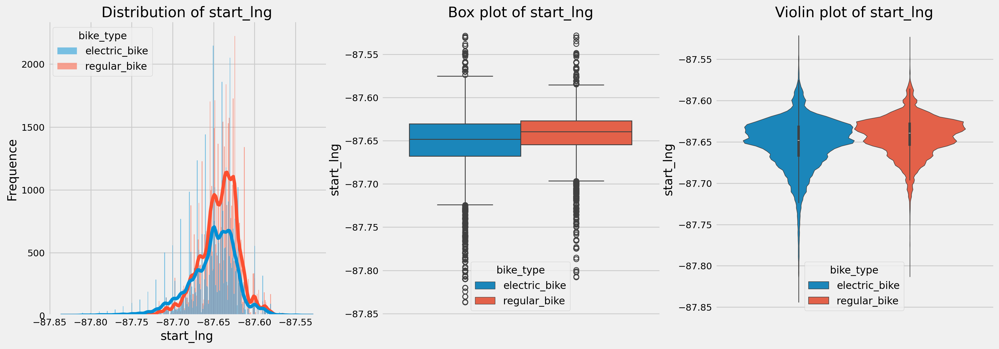


[`end_lat`]
Skewness:
bike_type
electric_bike   -0.5300
regular_bike    -0.1700
Name: end_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.3500
regular_bike    1.9100
Name: end_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


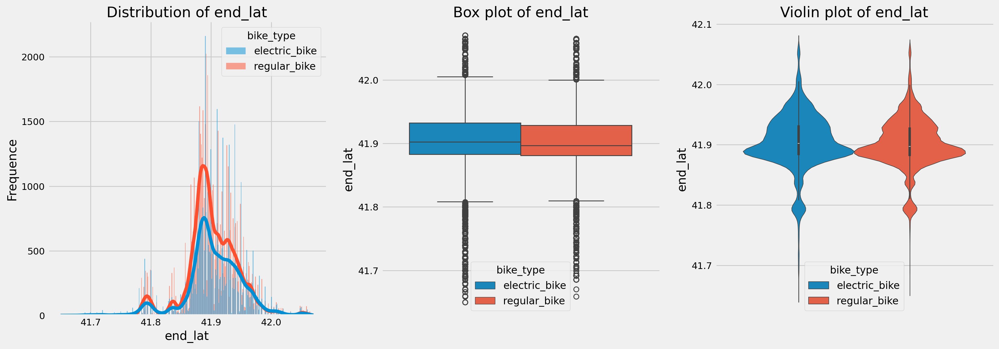


[`end_lng`]
Skewness:
bike_type
electric_bike   -0.9500
regular_bike    -0.5100
Name: end_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.6000
regular_bike    1.3500
Name: end_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


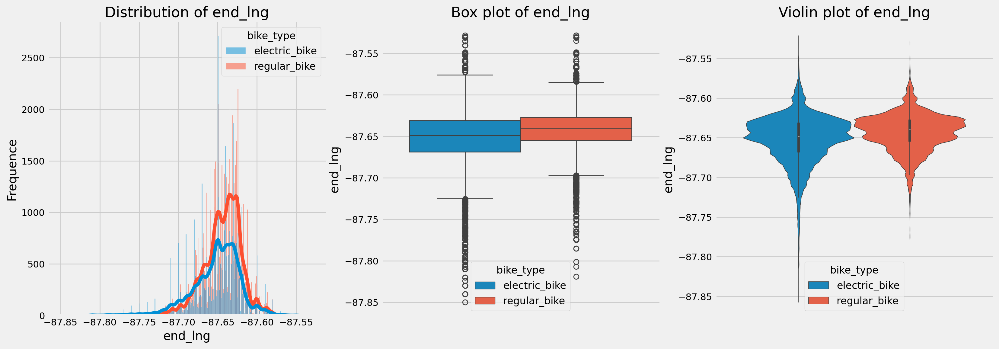


[`year`]
Skewness:
bike_type
electric_bike   -0.3100
regular_bike     0.1100
Name: year, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -0.9500
regular_bike    -1.2900
Name: year, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


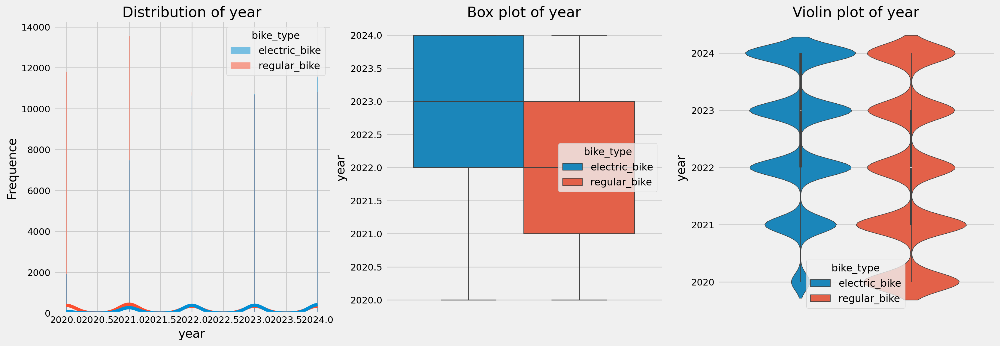


[`day`]
Skewness:
bike_type
electric_bike   0.0300
regular_bike    0.0400
Name: day, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -1.1800
regular_bike    -1.1800
Name: day, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


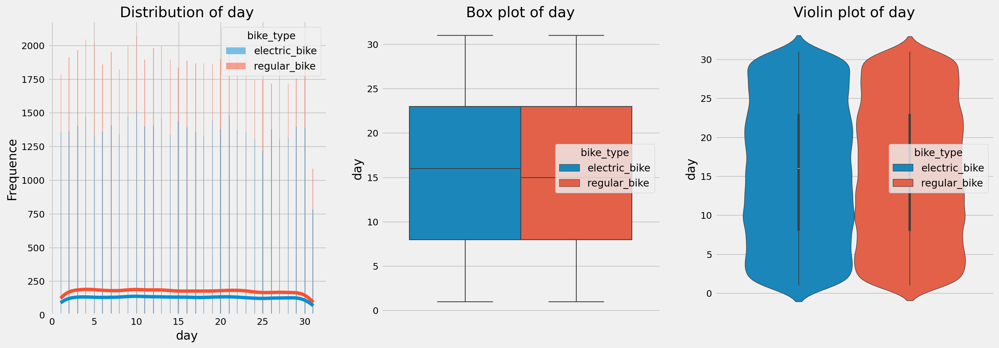


[`hour`]
Skewness:
bike_type
electric_bike   -0.5500
regular_bike    -0.5500
Name: hour, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -0.1100
regular_bike    -0.0100
Name: hour, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


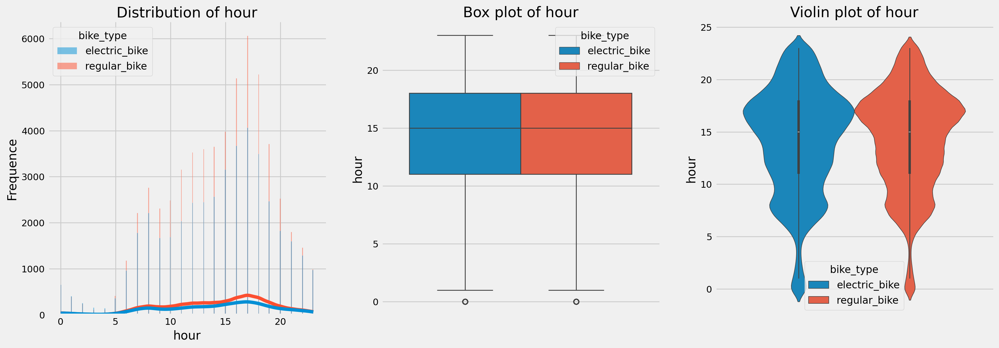


[`minute`]
Skewness:
bike_type
electric_bike   -0.0100
regular_bike     0.0000
Name: minute, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -1.2100
regular_bike    -1.2000
Name: minute, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


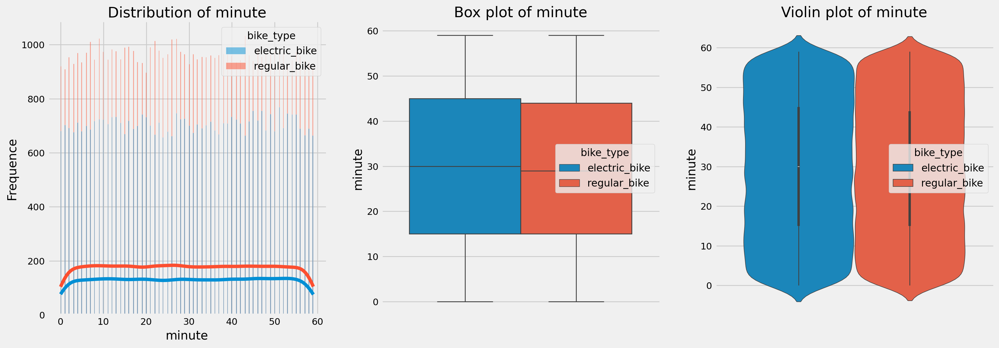


[`duration_min`]
Skewness:
bike_type
electric_bike     8.6700
regular_bike    166.9200
Name: duration_min, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike      156.6200
regular_bike    33,722.5000
Name: duration_min, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurt

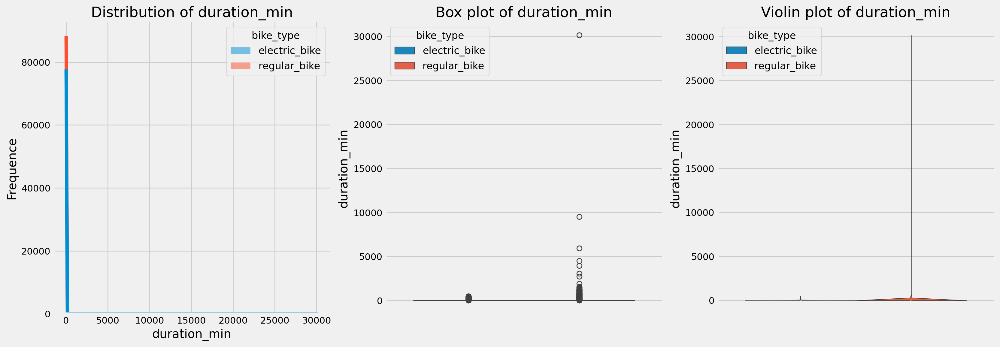


[`distance_km`]
Skewness:
bike_type
electric_bike   2.0800
regular_bike    2.1100
Name: distance_km, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   6.9100
regular_bike    7.5200
Name: distance_km, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        

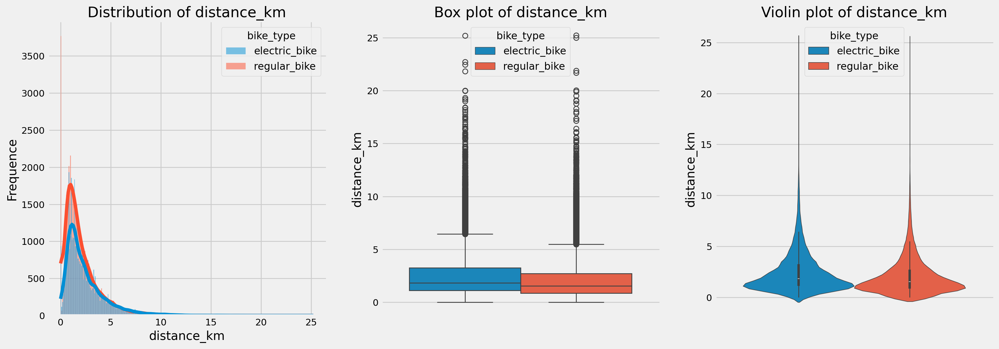


[`avg_speed_kmph`]
Skewness:
bike_type
electric_bike   -0.2100
regular_bike    -0.4700
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike    0.0000
regular_bike    -0.3200
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis

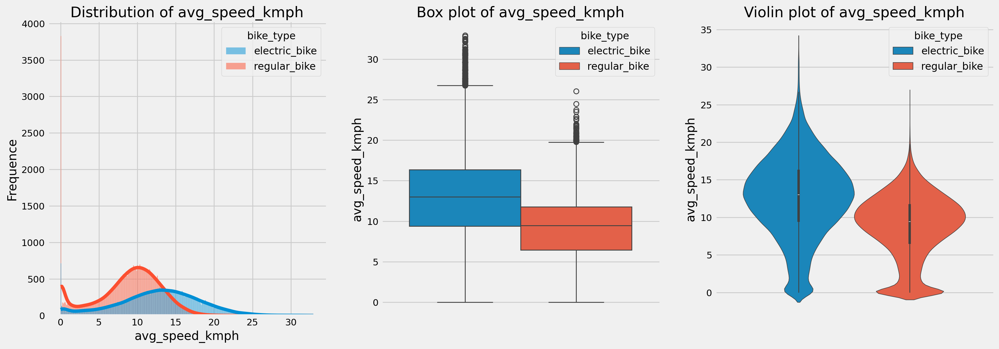

In [14]:
distplot(data.sample(n=1_00_000, random_state=12345), numeric_cols, by='bike_type')

#### Categorical Columns


[bike_type]
bike_type
electric_bike    10_814_673
regular_bike     14_663_979
Name: count, dtype: object


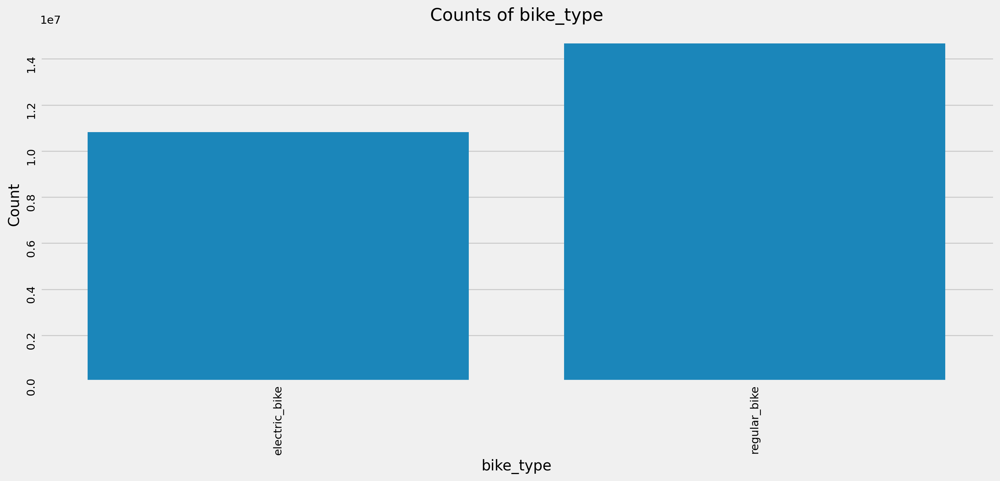


[rider_type]
rider_type
casual    10_037_648
member    15_441_004
Name: count, dtype: object


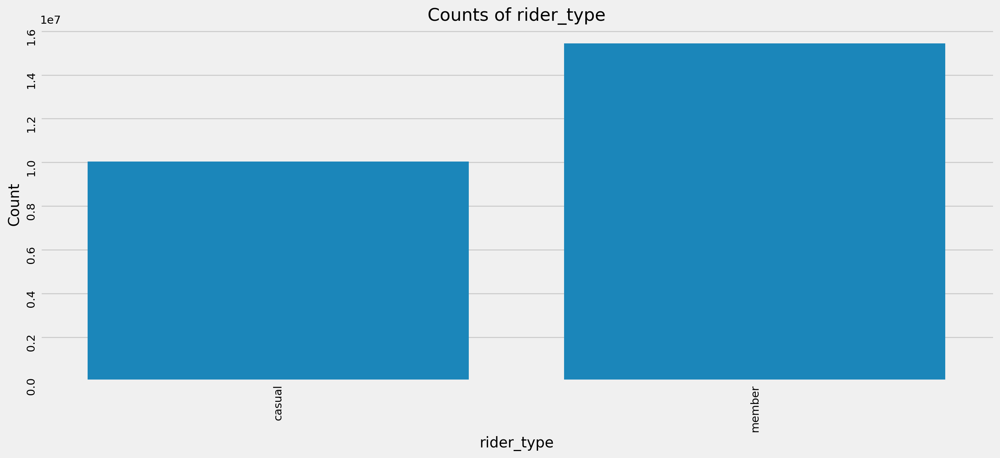


[year]
year
2020    3_463_814
2021    5_420_474
2022    5_460_732
2023    5_493_166
2024    5_640_466
Name: count, dtype: object


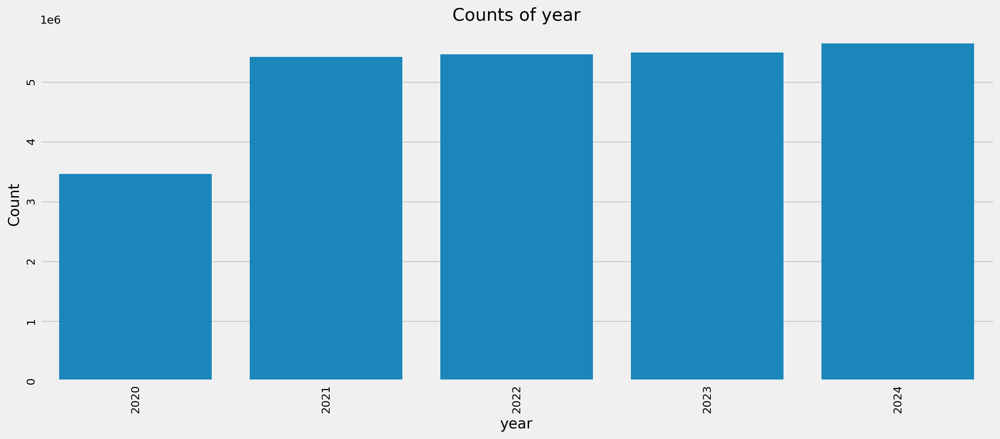


[quarter]
quarter
Q1     2_522_792
Q2     7_227_432
Q3    10_572_592
Q4     5_155_836
Name: count, dtype: object


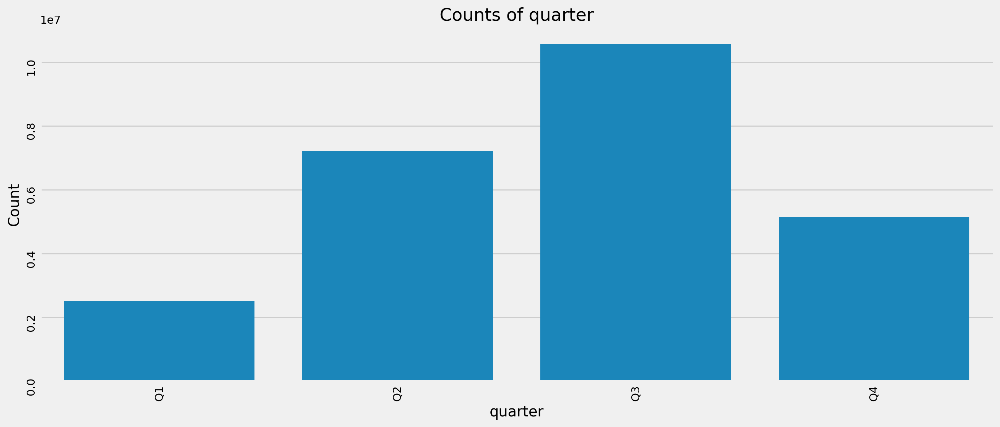


[month]
month
January        655_987
February       694_596
March        1_172_209
April        1_569_803
May          2_490_739
June         3_166_890
July         3_597_994
August       3_619_562
September    3_355_036
October      2_633_953
November     1_595_601
December       926_282
Name: count, dtype: object


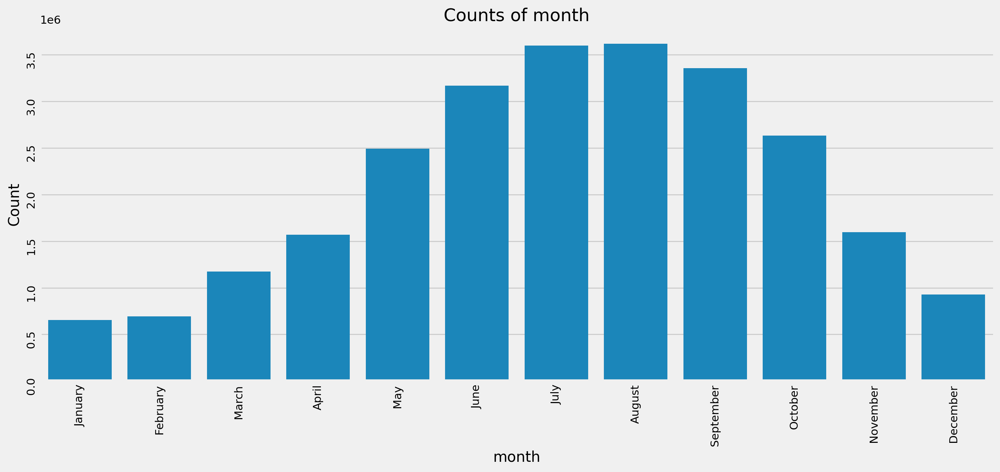


[day]
day
1     791_744
2     845_380
3     872_362
4     871_536
5     848_201
       ...   
27    815_675
28    757_177
29    784_457
30    827_455
31    478_217
Name: count, Length: 31, dtype: object


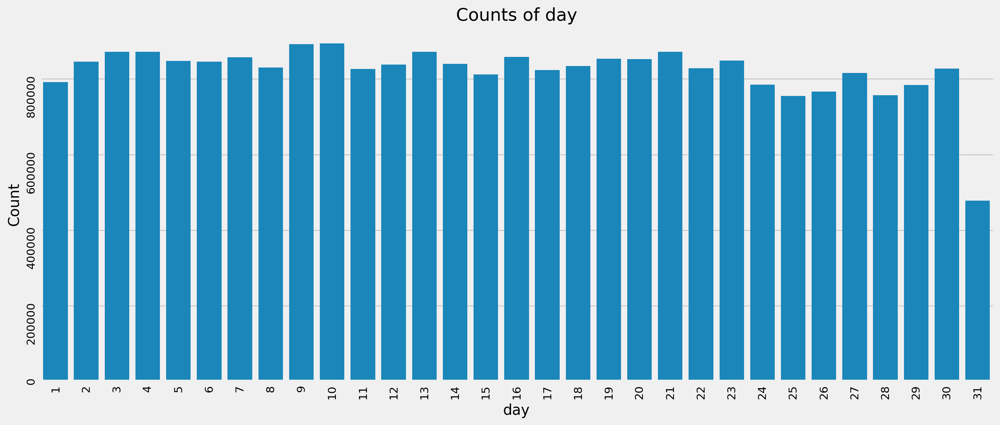


[hour]
hour
0       327_617
1       211_587
2       126_697
3        74_458
4        68_498
        ...    
19    1_575_798
20    1_103_214
21      861_491
22      699_634
23      488_283
Name: count, Length: 24, dtype: object


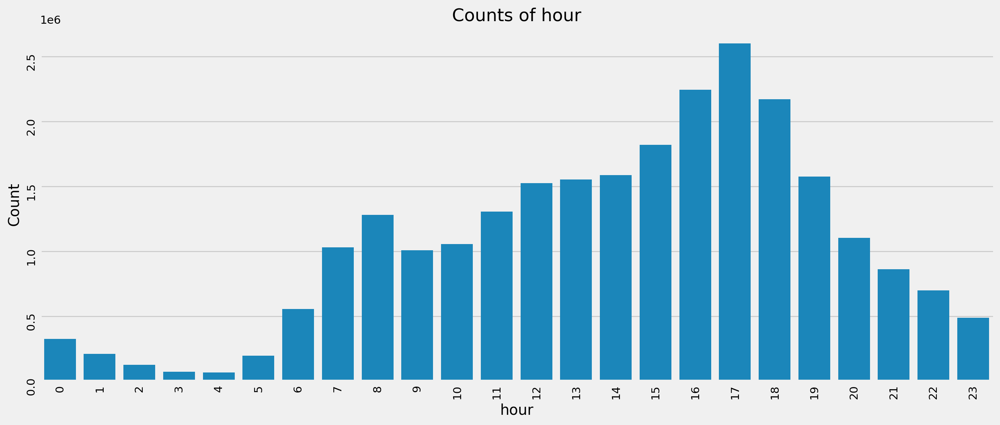


[minute]
minute
0     411_436
1     412_916
2     417_318
3     420_527
4     423_974
       ...   
55    423_447
56    421_218
57    418_919
58    416_930
59    412_349
Name: count, Length: 60, dtype: object


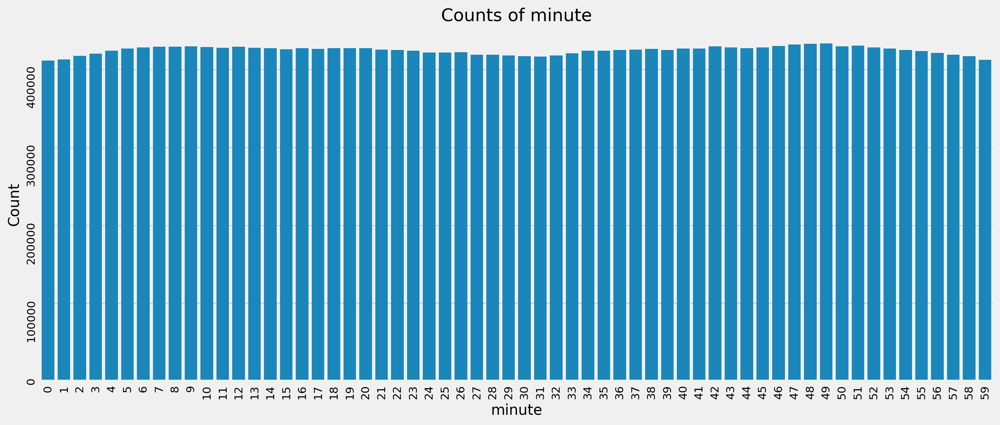


[season]
season
Winter     2_276_865
Spring     5_232_751
Summer    10_384_446
Autumn     7_584_590
Name: count, dtype: object


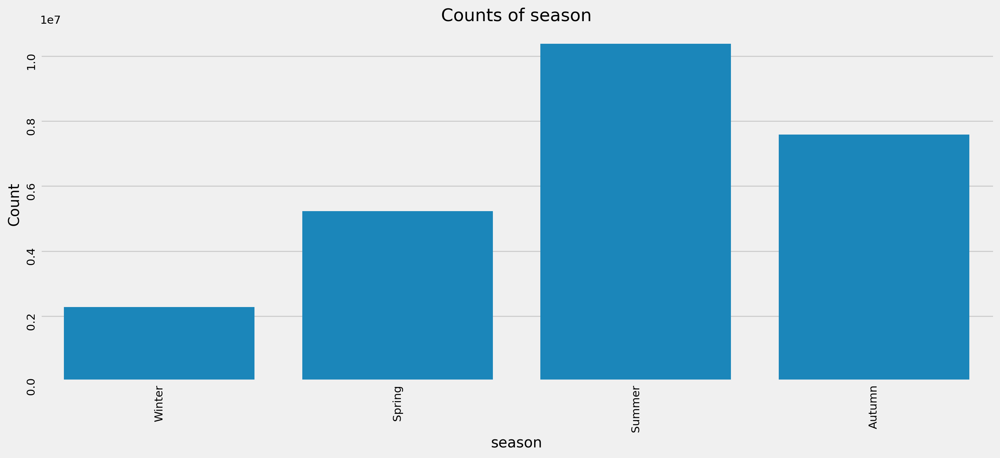


[weekday]
weekday
Monday       3_289_846
Tuesday      3_481_440
Wednesday    3_627_028
Thursday     3_638_552
Friday       3_691_954
Saturday     4_188_607
Sunday       3_561_225
Name: count, dtype: object


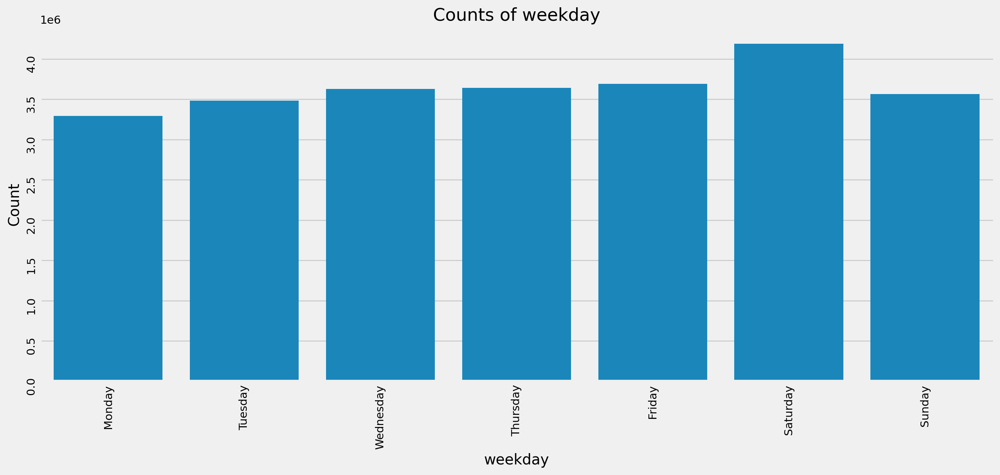


[part_day]
part_day
Late Night         740_359
Early Morning    1_854_105
Morning          4_654_951
Noon             6_486_762
Evening          8_589_853
Night            3_152_622
Name: count, dtype: object


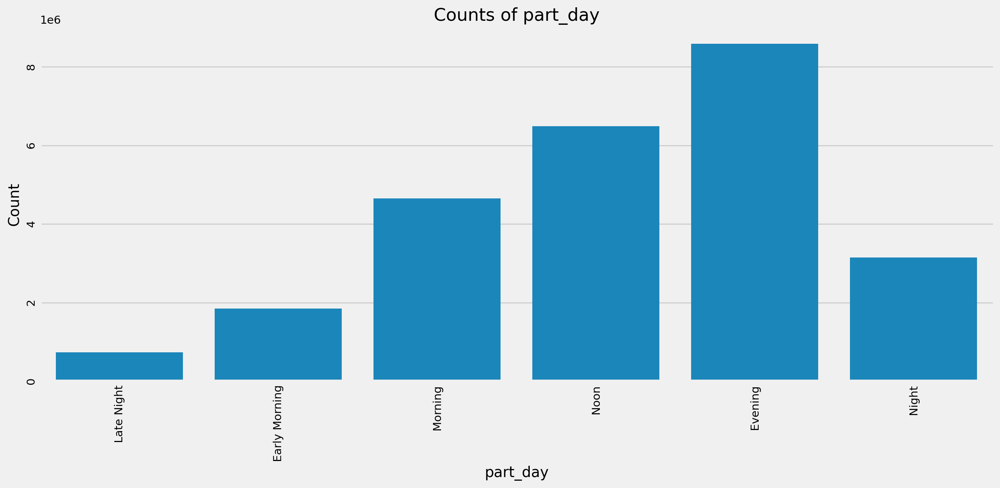

In [15]:
for i, col in zip(range(11), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'minute', 'season', 'weekday', 'part_day']):
    print(f'\n[{col}]')
    # summary table for the variable
    col_table = data[col].value_counts().sort_index()
    print(col_table.map('{:_}'.format))
    plt.figure(figsize = (15, 6))
    sns.countplot(x=col, data=data, order=col_table.index)    
    #axes[i].bar_label(axes[i].containers[0])
    plt.tick_params(labelrotation=90)
    plt.title(f'Counts of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

#### Bivariate Analysis <a name='bivariate-analysis'></a>

In [16]:
# TODO: Use median instead of mean for `distance_km`, `duration_min` and `avg_speed_kmph`, such as median is more robust to outliers

##### By `duration_min`

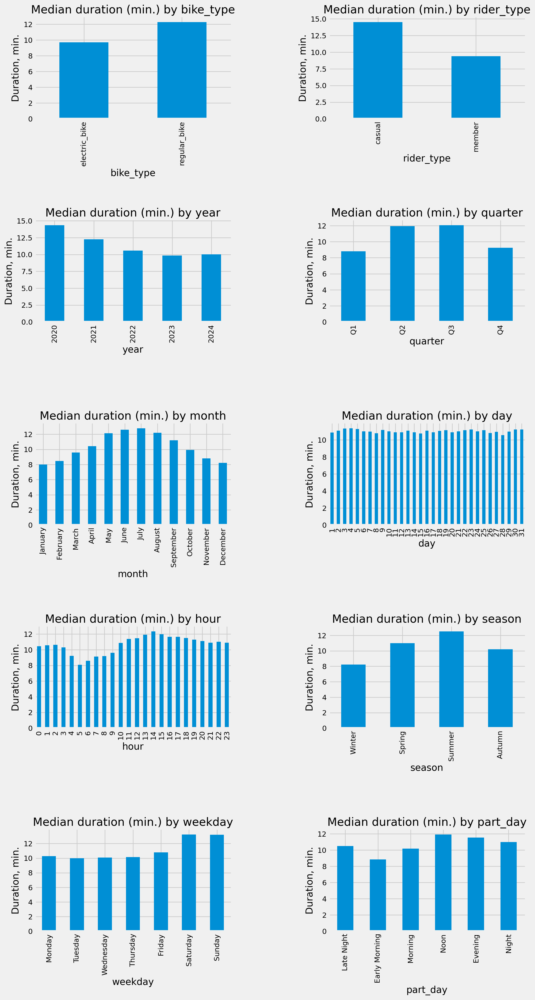

In [17]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'duration_min'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax)
 
    ax.set_title(f"Median duration (min.) by {column}")
    ax.set_ylabel(f'Duration, min.')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

##### By `distance_km`

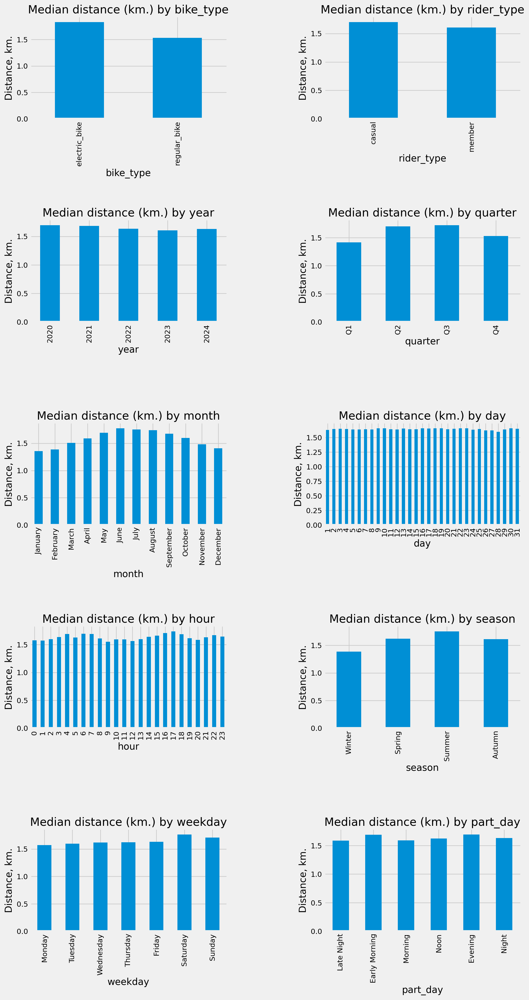

In [18]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'distance_km'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax, )
 
    ax.set_title(f"Median distance (km.) by {column}")
    ax.set_ylabel(f'Distance, km.')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

##### By `avg_speed_kmph`

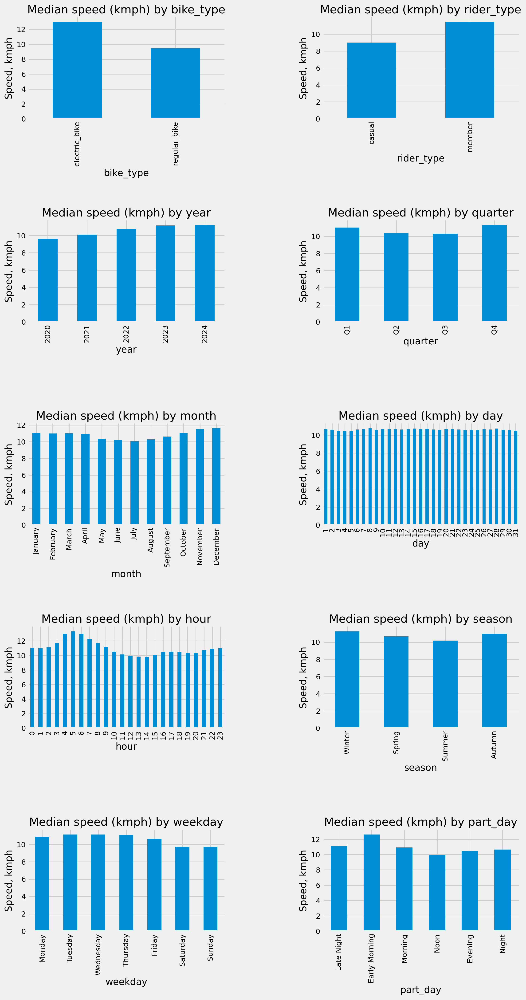

In [19]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'avg_speed_kmph'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax)
 
    ax.set_title(f"Median speed (kmph) by {column}")
    ax.set_ylabel(f'Speed, kmph')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

In [20]:
data.groupby(['rider_type', 'bike_type'], observed=True)[['duration_min', 'distance_km', 'avg_speed_kmph']].agg(['median'])

duration_min distance_km avg_speed_kmph
                               median      median         median
rider_type bike_type                                            
casual     electric_bike      11.3500      1.8408        11.4804
           regular_bike       17.9000      1.6202         7.5036
member     electric_bike       8.7667      1.8229        13.8420
           regular_bike        9.8833      1.4734        10.3185

#### Heatmap

In [21]:
from folium.plugins import HeatMap
import folium

# Chicago latitude and longitude values
latitude = 41.881832
longitude = -87.623177

In [22]:
def heatmap(df):
    """
        Displays a heatmap on Chicago city map.

        Args:
            df (pandas.DataFrame): A data frame with GPS coordinates and number of rides.

        Return:
            A heat map.
    """
    chicago_map = folium.Map(location=[latitude, longitude], zoom_start=10)
    HeatMap(df, min_opacity=0.4, blur=18).add_to(folium.FeatureGroup(name='Heat Map').add_to(chicago_map))
    
    return chicago_map

##### All Rides

In [23]:
heatmap(data.loc[:, ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Casual riders

In [24]:
heatmap(data.loc[data['rider_type'] == 'casual', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Subsribers

In [25]:
heatmap(data.loc[data['rider_type'] == 'member', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Regular Bikes

In [26]:
heatmap(data.loc[data['bike_type'] == 'regular_bike', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Electric Bikes

In [27]:
heatmap(data.loc[data['bike_type'] == 'electric_bike', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

### Save the Data

In [28]:
# save processed dataset fot further analysis
data_divvy = data
%store data_divvy

Stored 'data_divvy' (DataFrame)


In [29]:
%load_ext watermark
%watermark -d -t -v -p numpy,pandas,matplotlib,seaborn,sklearn,statsmodels

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.26.0

numpy      : 1.26.4
pandas     : 2.2.2
matplotlib : 3.9.1
seaborn    : 0.13.2
sklearn    : 1.5.1
statsmodels: 0.14.2




---
\
[__<< Data Cleaning__](./02_Divvy_data_cleaning.ipynb) | [__Home__](../README.md) | [__Feature Engineering >>__](./04_Divvy_feature_engineering.ipynb)
\
\
Divvy: Bike Sharing Forecast, _March 2025_